In [58]:
import os
import re
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns
from matplotlib.pyplot import rc_context
from tqdm.notebook import tqdm, trange
from sklearn.preprocessing import MinMaxScaler
sc.settings.verbosity = 3

from tqdm import tqdm

In [59]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [60]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [61]:
experiment = "Tonsil"
adata = sc.read_h5ad(data_dir / "adata" /f"{experiment}.h5ad")

C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [62]:
adata_imc = sc.read_h5ad(data_dir / "adata" /f"{experiment}_GC_1017.h5ad")

In [63]:
adata_imc.var_names

Index(['CD20', 'CD21', 'CD27', 'CD3', 'CD38', 'CD4', 'CXCR5', 'EZH2',
       'H3K27me3', 'ICOS1', 'Ki67', 'PD1'],
      dtype='object')

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


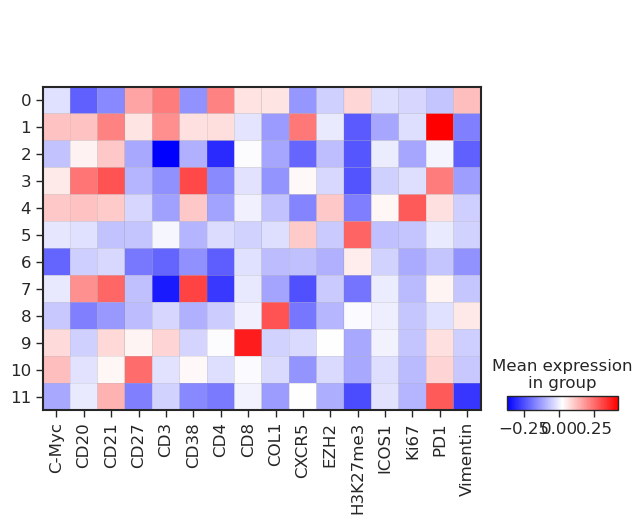

In [64]:
sc.pl.matrixplot(adata, adata.var_names, groupby='leiden', cmap='bwr')

In [65]:
import matplotlib 

colors = adata.uns["leiden_colors"]
labels = adata.obs.leiden.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


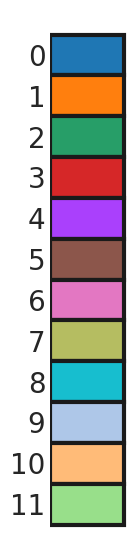

In [66]:
# legend
fig, ax = plt.subplots(figsize=(1,7))
ax.barh(y=range(len(colors_rgb_dict.values())), 
        color=np.array(list(colors_rgb_dict.values()))/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.yticks(range(len(colors_rgb_dict.values())), colors_rgb_dict.keys(), rotation=0, size=20)
_ = plt.xticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
# ax.yaxis.tick_right()
ax.invert_yaxis()
ax.grid(False)


# Spatial Projection 

In [67]:
import networkx as nx
import numpy as np
import pandas as pd
import skimage 
from skimage import measure

# Plotting
def create_intensity_cell(mask, cell2intensity, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan

    for cell, intensity in tqdm(cell2intensity.items(), total=len(cell2intensity)):
        rows, cols = np.where(np.isin(mask, cell))
        img[rows, cols] = intensity
    return img

def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks

def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img

def get_contour(mask: np.ndarray):
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [68]:
# experiment = 'tonsil'
# masks = get_masks(data_dir / "masks", f"{experiment}")

# for dataset in adata.obs['Core'].unique():
#     adata_fov = adata[adata.obs['Core'] == dataset]

#     try:
#         mask = masks["_".join(['tonsil', dataset])]
#         contours = get_contour(mask)
#     except:
#         print(dataset)
#         continue
#      # Get label2cell dict
    
#     label2cell = {}
#     for i, l in enumerate(labels):
#         cell_id = adata_fov[adata_fov.obs.leiden == l].obs.Cell.to_list()
#         label2cell[i] = cell_id

#     img = create_clustered_cell(mask, label2cell, colors_rgb)

#     fig, ax = plt.subplots(figsize=(7, 7))
#     ax.imshow(img)
#     for j, contour in enumerate(contours):
#         ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
#     ax.axis("off")
#     plt.show()

#     fig.savefig(f'{dataset}.png', bbox_inches='tight',transparent=True, pad_inches=0)


# PseudoTime

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9945667  0.99095047 0.9871861  0.9838317  0.97996044
     0.9744176  0.9718769  0.9657546  0.9635944  0.9602088  0.9575661
     0.9554845  0.95347106 0.95149165]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


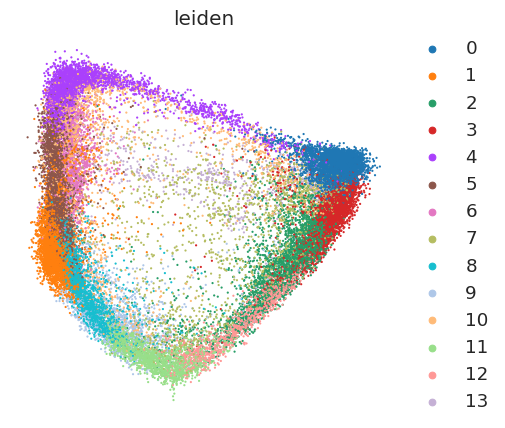

In [69]:
# Diff Map
adata_b = adata_imc[:,['CD20', 'CD21', 'CD27', 'CD3', 'CD38', 'CD4', 'CXCR5', 'Ki67', 'EZH2', 'PD1', 'ICOS1']].copy()

sc.tl.diffmap(adata_b)
adata_b.obsm["X_diffmap_"] = np.arcsinh(
    adata_b.obsm["X_diffmap"][:, [1,2]]
)

sc.pp.neighbors(adata_b)
sc.tl.leiden(adata_b, resolution=0.6)

fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_b, 'diffmap_', color=['leiden'], size=10, ax=ax, frameon=False)

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


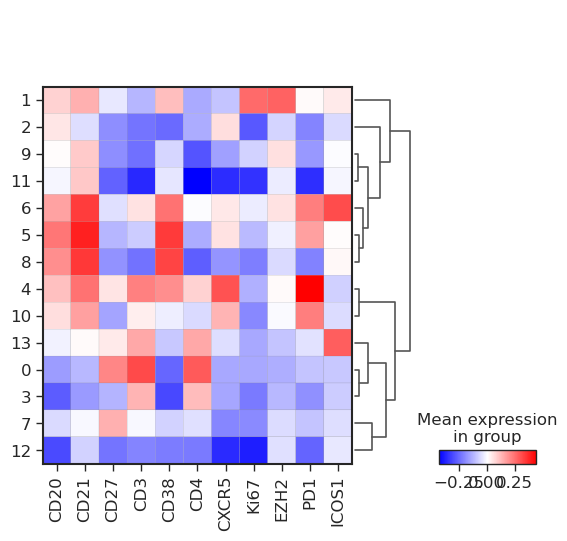

In [70]:
sc.tl.dendrogram(adata_b, groupby='leiden')
sc.pl.matrixplot(adata_b, adata_b.var_names, groupby=['leiden'],  cmap='bwr', dendrogram=True)

In [71]:
import matplotlib 

colors = adata_b.uns["leiden_colors"]
labels = adata_b.obs.leiden.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 164.70it/s]


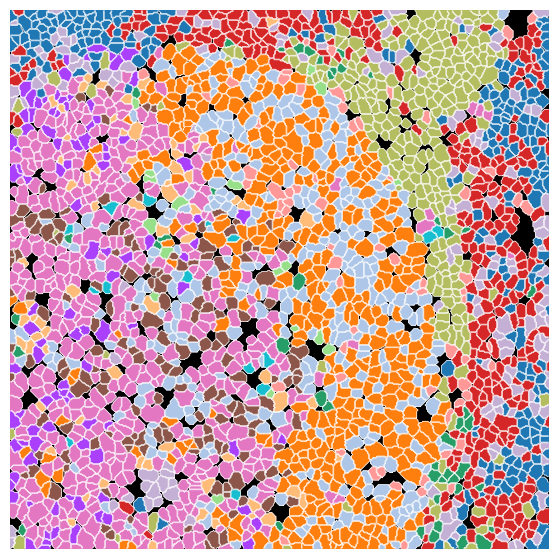

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 179.49it/s]


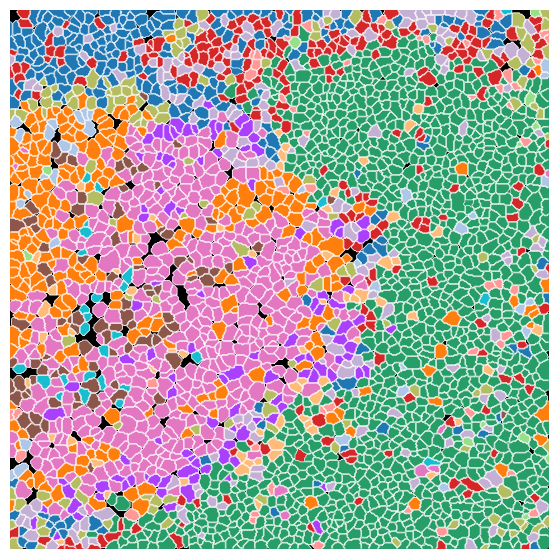

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 225.81it/s]


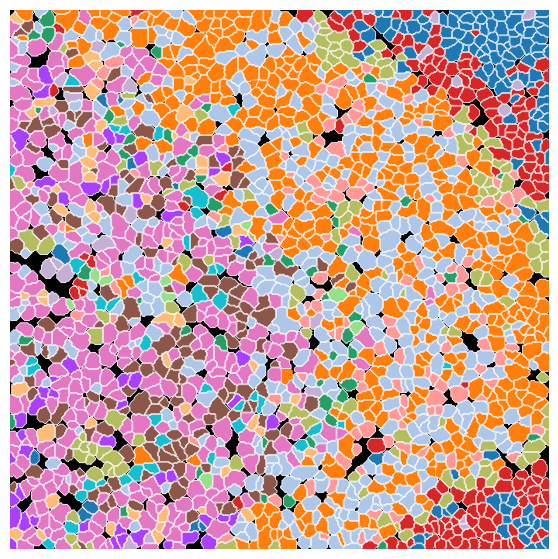

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 215.39it/s]


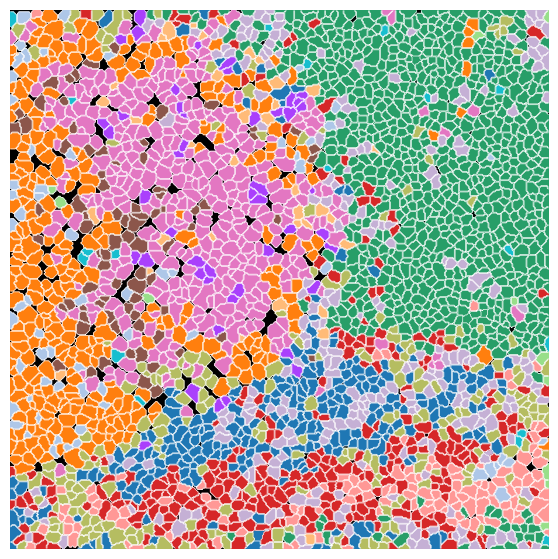

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 233.33it/s]


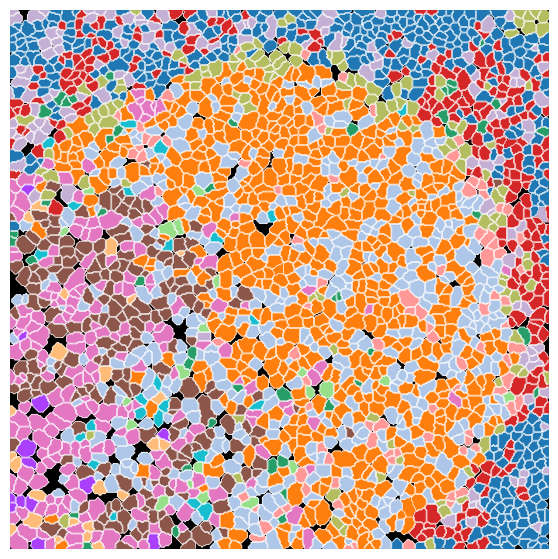

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 144.33it/s]


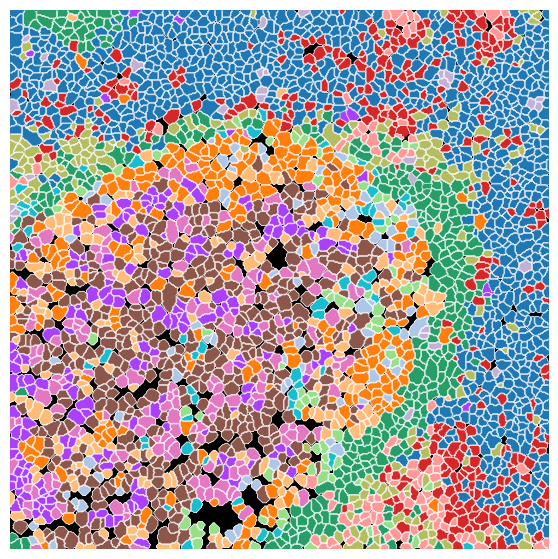

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 159.09it/s]


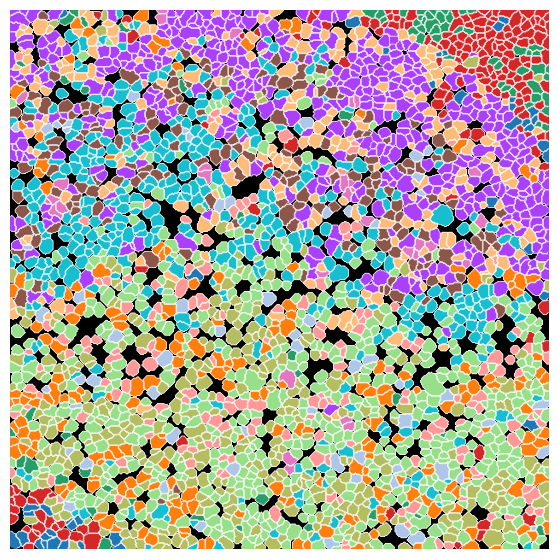

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 145.83it/s]


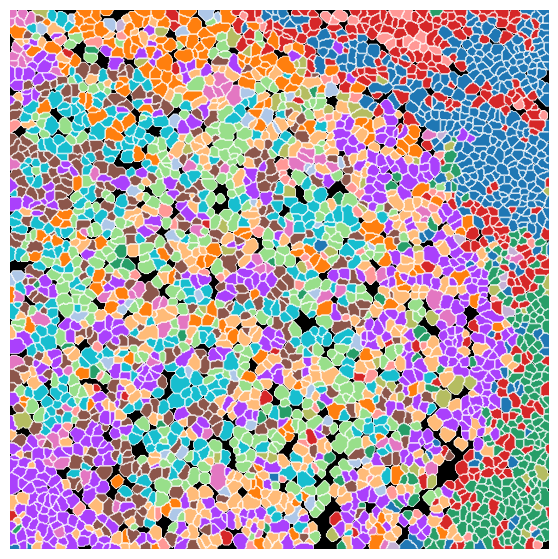

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 153.85it/s]


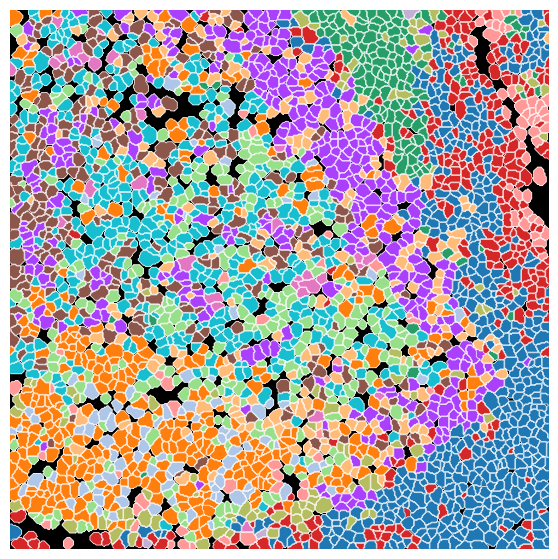

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 233.33it/s]


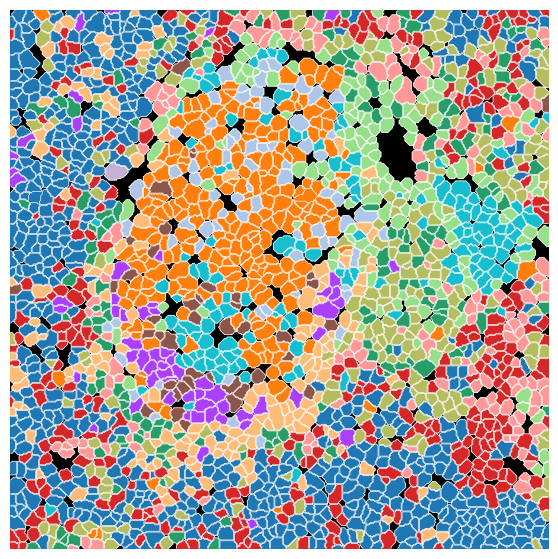

100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 158.15it/s]


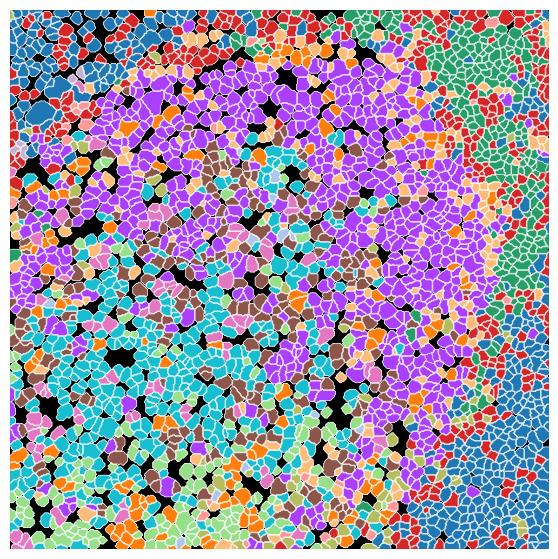

In [72]:
experiment = 'tonsil'
masks = get_masks(data_dir / "masks", f"{experiment}")

for dataset in adata_b.obs['Core'].unique():
    adata_fov = adata_b[adata_b.obs['Core'] == dataset]

    try:
        mask = masks["_".join(['tonsil', dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    for i, l in enumerate(labels):
        cell_id = adata_fov[adata_fov.obs.leiden == l].obs.Cell.to_list()
        label2cell[i] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()

    fig.savefig(f'{dataset}.png', bbox_inches='tight',transparent=True, pad_inches=0)


In [73]:
adata_b = adata_b[~adata_b.obs.leiden.isin(['0', '2', '3', '7'])]

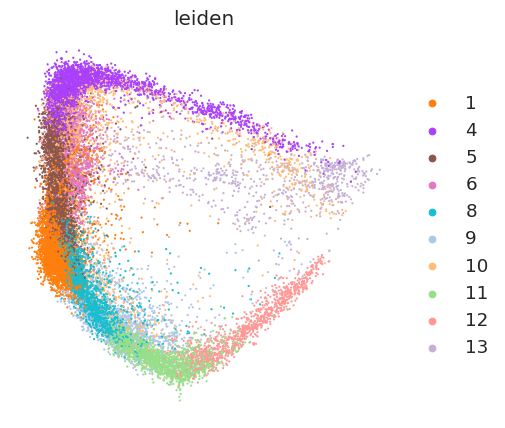

In [74]:
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_b, 'diffmap_', color=['leiden'], size=10, ax=ax, frameon=False)

## Pseudotime

In [75]:
adata_ = adata_b.copy()

C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [76]:
sc.pp.neighbors(adata_, metric='cosine')
sc.tl.umap(adata_)
sc.tl.diffmap(adata_, n_comps=5)
# adata_.obsm["X_diffmap_"] = np.arcsinh(
#     adata_.obsm["X_diffmap"][:, [1,2]]
# )

sc.tl.leiden(adata_, resolution=0.6)


computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
computing Diffusion Maps using n_comps=5(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9946264  0.99063385 0.98722243 0.98613006]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


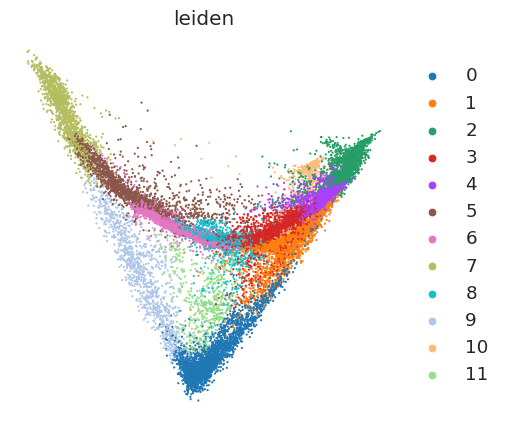

In [77]:
adata_.obsm["X_diffmap_"] = adata_.obsm["X_diffmap"][:, [1,2]]

fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_, 'diffmap_', color=['leiden'], size=10, ax=ax, frameon=False)

computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE


C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:58)


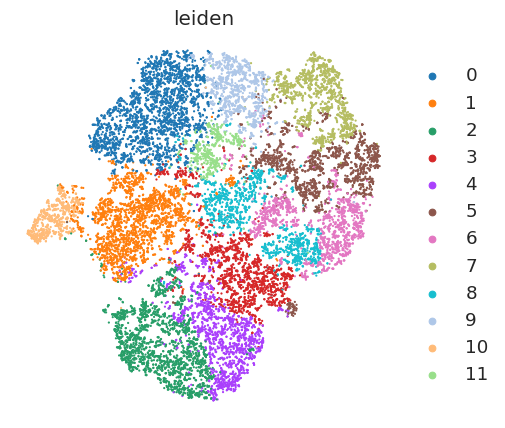

In [78]:
sc.tl.tsne(adata_)
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_, 'tsne', color=['leiden'], size=10, ax=ax, frameon=False)

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


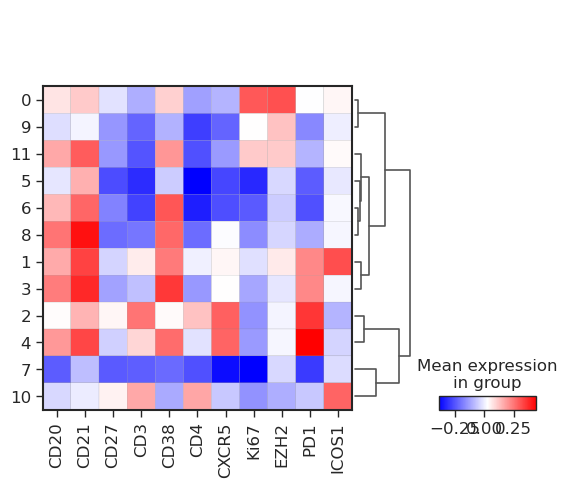

In [79]:
sc.tl.dendrogram(adata_, groupby='leiden')
sc.pl.matrixplot(adata_, adata_b.var_names, groupby=['leiden'],  cmap='bwr', dendrogram=True)

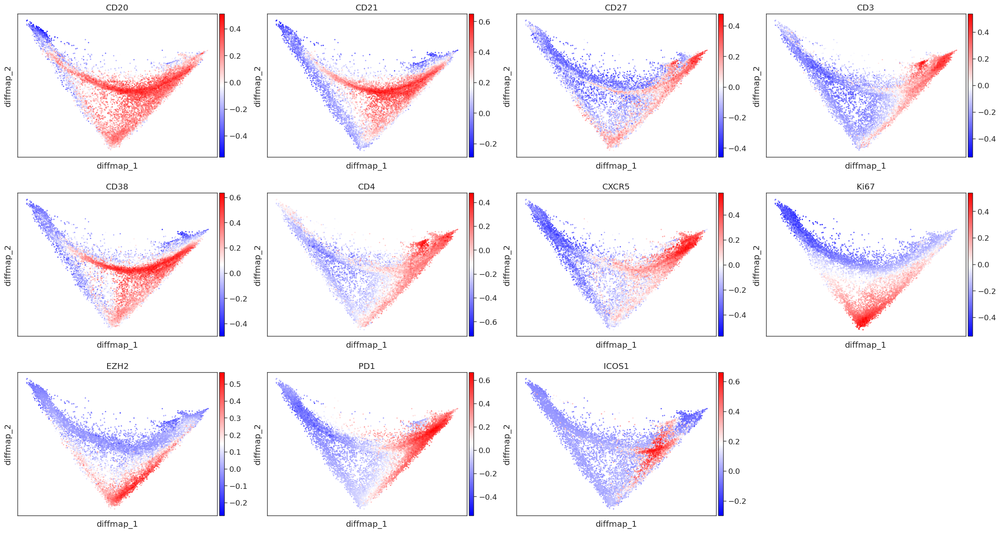

In [80]:
sc.pl.embedding(adata_, basis='diffmap_', color=adata_.var_names, cmap='bwr', size=20, ncols=4)

In [81]:
import matplotlib 

colors = adata_b.uns["leiden_colors"]
labels = adata_b.obs.leiden.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 173.90it/s]


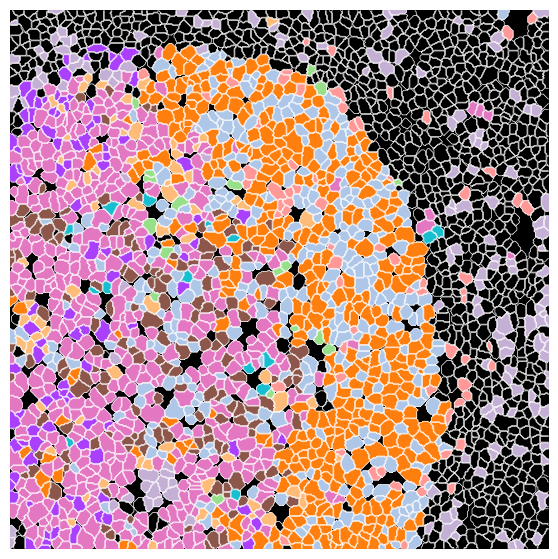

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 185.19it/s]


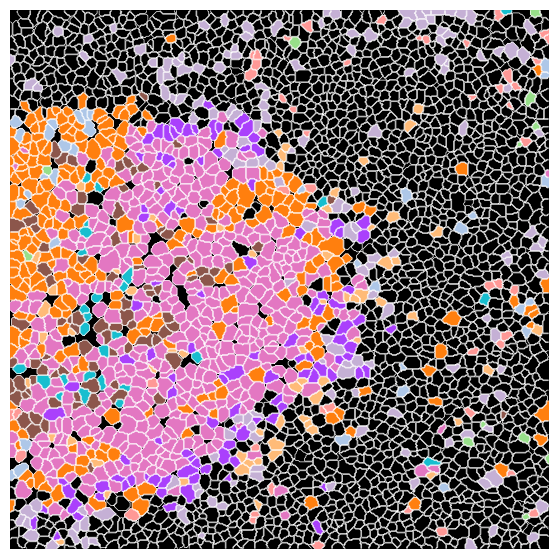

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 238.10it/s]


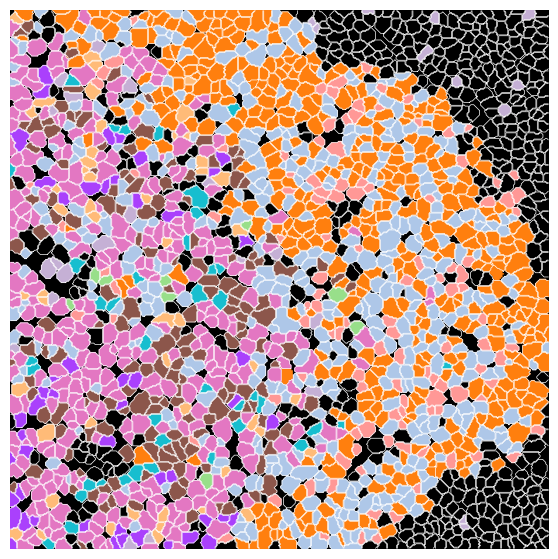

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 232.56it/s]


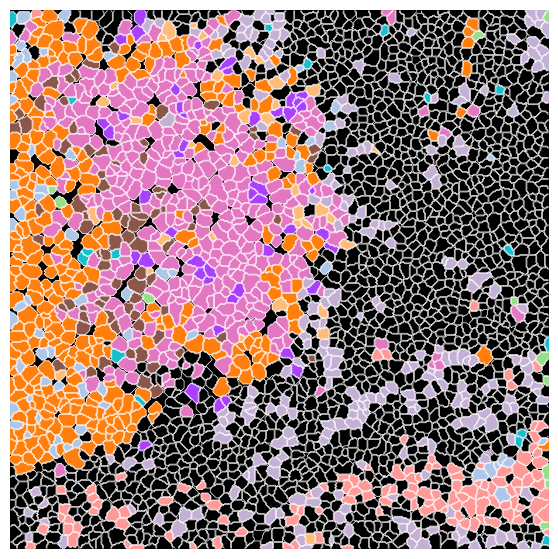

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 250.00it/s]


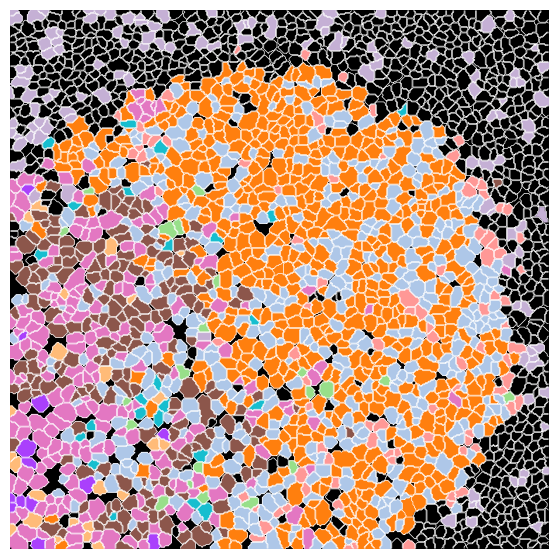

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 144.93it/s]


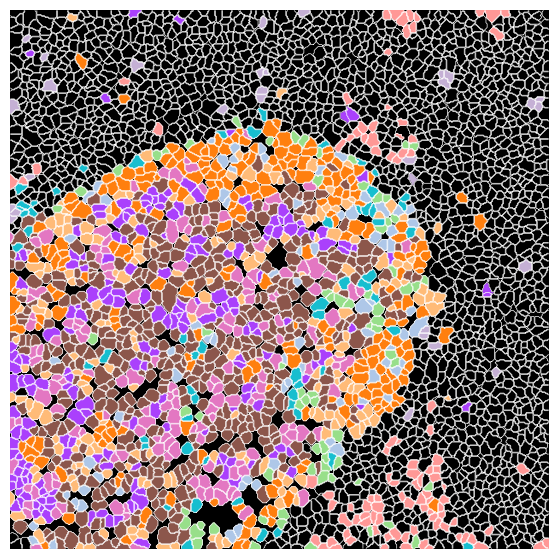

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 158.73it/s]


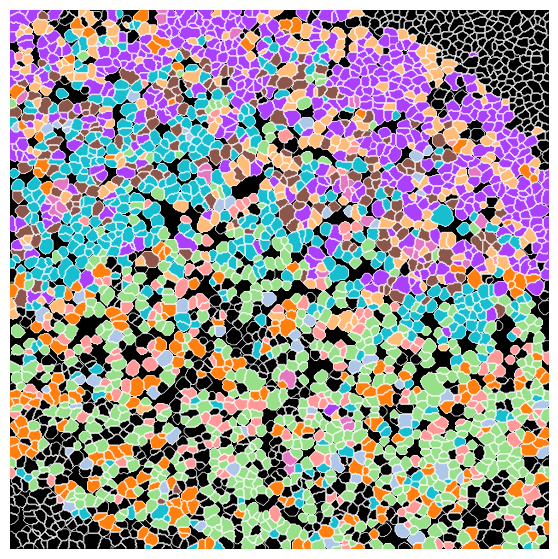

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 156.25it/s]


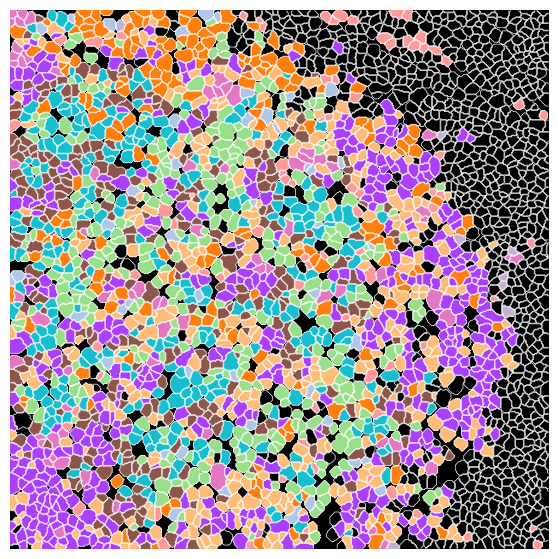

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 161.29it/s]


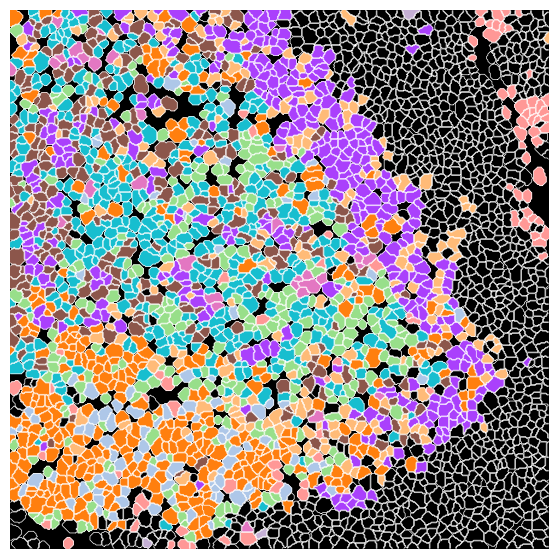

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 232.57it/s]


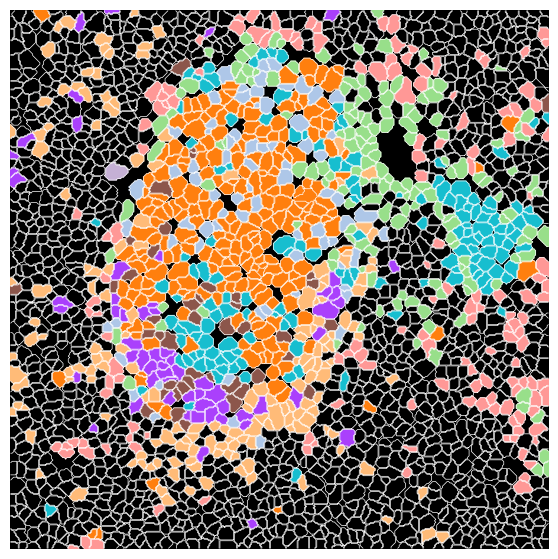

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 169.49it/s]


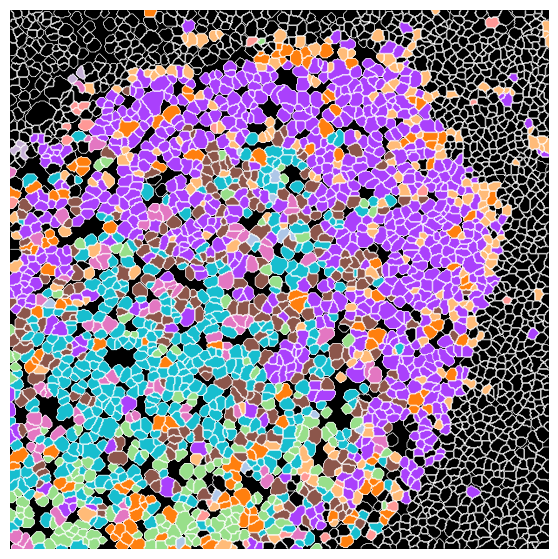

In [83]:
experiment = 'tonsil'
masks = get_masks(data_dir / "masks", f"{experiment}")

for dataset in adata_b.obs['Core'].unique():
    adata_fov = adata_b[adata_b.obs['Core'] == dataset]

    try:
        mask = masks["_".join(['tonsil', dataset])]
        contours = get_contour(mask)
    except:
        print(dataset)
        continue
     # Get label2cell dict
    
    label2cell = {}
    for i, l in enumerate(labels):
        cell_id = adata_fov[adata_fov.obs.leiden == l].obs.Cell.to_list()
        label2cell[i] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()

    fig.savefig(f'2_{dataset}.png', bbox_inches='tight',transparent=True, pad_inches=0)


### Rename clusters

In [231]:
mapping = dict(zip(
    ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], 
    ['DZ2', 'MZ', 'PB1', 'AB', 'LZ1', 'LZ3', 'PB2', 'MB', 'DZ1', 'LZ2', 'LZ4']
))
# Define new clusters
adata_.obs["Phenotype"] = (
    adata_.obs["leiden"]
    .map(lambda x: mapping.get(x, x))
    .astype("category")
)
adata_.uns["Phenotype_colors"] = adata_.uns["leiden_colors"]  

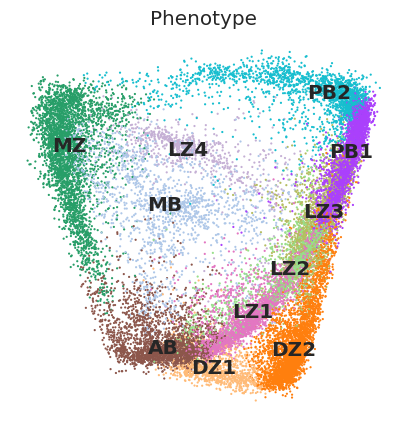

In [232]:
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_, 'diffmap_', color=['Phenotype'], size=10, ax=ax, frameon=False, legend_loc='on data')

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


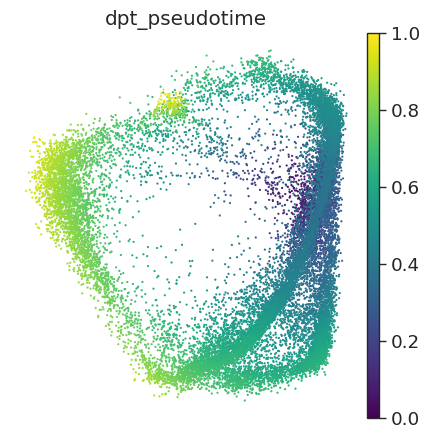

In [291]:
# Pseudo time 
adata_.uns['iroot'] = np.flatnonzero(adata_.obs['leiden']  == '3')[0]
sc.tl.dpt(adata_)

fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_, 'diffmap_', color=['dpt_pseudotime'], size=10, ax=ax, frameon=False, cmap='viridis')

In [235]:
paths = [('B cells', ['8', '4', '9', '5', '2', '6'])]
# paths = [('DZ', ['3', '8', '0'])]


In [236]:
adata_.obs['distance'] = adata_.obs['dpt_pseudotime']
adata_.obs['clusters'] = adata_.obs['leiden']  # just a cosmetic change
adata_.uns['clusters_colors'] = adata_.uns['leiden_colors']


In [237]:
gene_names_ = ['CD20', 'CXCR5', 'Ki67', 'CD27', 'CD38', 'PD1']

0 ('B cells', ['8', '4', '9', '5', '2', '6'])


C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\scanpy\plotting\_tools\paga.py:1229: UserWarning: FixedFormatter should only be used together with FixedLocator
  groups_axis.set_yticklabels(['', xlabel, ''], fontsize=ytick_fontsize)
C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\scanpy\plotting\_tools\paga.py:1276: UserWarning: FixedFormatter should only be used together with FixedLocator
  anno_axis.set_yticklabels(['', anno, ''], fontsize=ytick_fontsize)
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


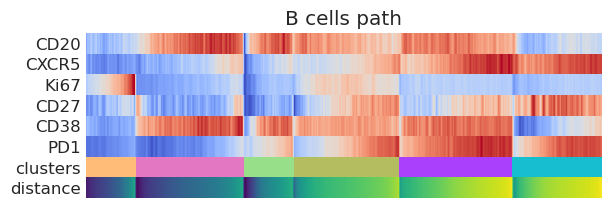

In [238]:
_, axs = plt.subplots(ncols=1, figsize=(6, round(len(gene_names_)/3)), gridspec_kw={'wspace': 0.05, 'left': 0.12})
plt.subplots_adjust(left=0.05, right=0.98, top=0.82, bottom=0.2)
for ipath, (descr, path) in enumerate(paths):
    print (ipath,(descr, path))
    _, data = sc.pl.paga_path(
        adata_, path, gene_names_,
        show_node_names=False,
#         ax=axs[ipath],
        ytick_fontsize=12,
        left_margin=0.15,
        n_avg=50,
        annotations=['distance'],
        show_yticks=True if ipath==0 else False,
        show_colorbar=False,
        color_map='coolwarm',
        groups_key='clusters',
        color_maps_annotations={'distance': 'viridis'},
        title='{} path'.format(descr),
        return_data=True,
        normalize_to_zero_one=True,
        show=False)
    
plt.show()

In [239]:
adata_btraj = adata_[adata_.obs['leiden'].isin(paths[0][1])]

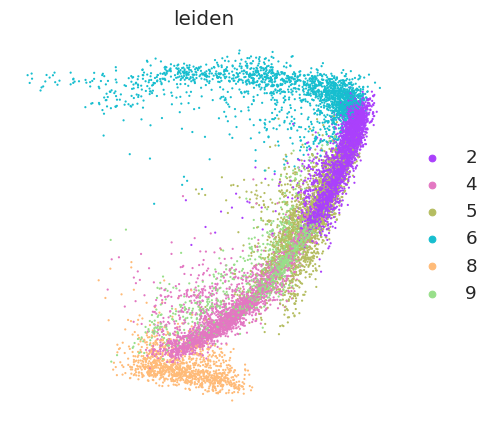

In [240]:
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_btraj, 'diffmap_', color=['leiden'], size=10, ax=ax, frameon=False)

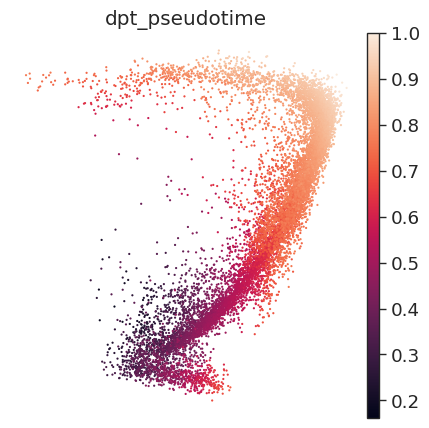

In [241]:
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.embedding(adata_btraj, 'diffmap_', color=['dpt_pseudotime'], size=10, ax=ax, frameon=False)

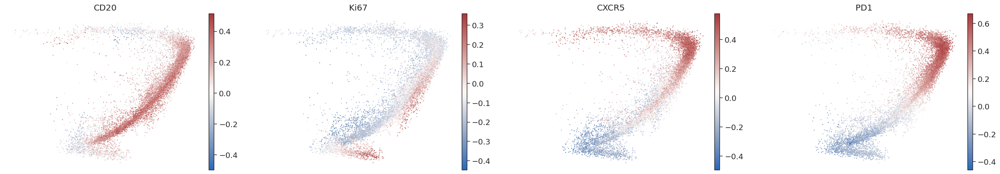

In [242]:
sc.pl.embedding(adata_btraj, 'diffmap_', color=['CD20', 'Ki67', 'CXCR5', 'PD1'], size=10, frameon=False, cmap='vlag')

## Palentir

In [84]:
import palantir
import harmony 
%matplotlib inline

adata_temp = adata_.copy()
adata_temp = adata_temp[:, ['CD20', 'CD21', 'CD27', 'CD38', 'CXCR5', 'EZH2', 'ICOS1', 'Ki67', 'PD1']]
adata_temp.obs = adata_temp.obs.reset_index(drop=True)

pca_projections, _ = palantir.utils.run_pca(adata_temp, n_components=5, use_hvg=False)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=5)
ms_data = palantir.utils.determine_multiscale_space(dm_res)

computing PCA
    with n_comps=5
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors


C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [85]:
tsne = palantir.utils.run_tsne(ms_data)
adata_temp.obsm['X_tsne'] = tsne.values

Could not import 'MulticoreTSNE'. Install for faster runtime. Falling back to scikit-learn.


C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


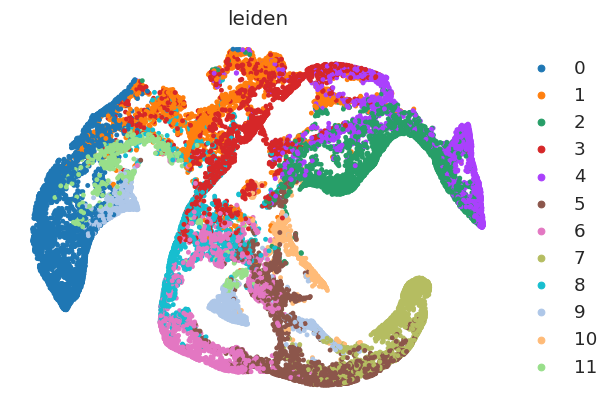

In [86]:
sc.pl.embedding(adata_temp, basis='tsne',
               color=['leiden'], frameon=False, cmap='plasma', size=50)
plt.show()

In [267]:
embedding = pd.DataFrame(adata_temp.obsm['X_diffmap_'], columns=['x', 'y'], index=adata_temp.obs.index)

(<Figure size 400x400 with 1 Axes>, <AxesSubplot:>)

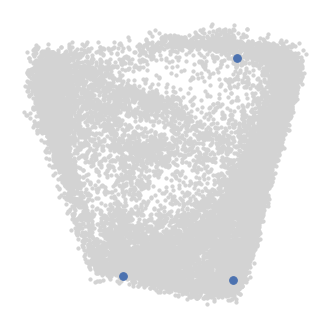

In [273]:
cells = [np.flatnonzero(adata_temp.obs['leiden']  == '3')[10], 
         np.flatnonzero(adata_temp.obs['leiden']  == '0')[10], 
         np.flatnonzero(adata_temp.obs['leiden']  == '6')[10]]
palantir.plot.highlight_cells_on_tsne(embedding, cells)


In [274]:
terminal_states = pd.Series(['DZ', 'Non GC'], 
                           index=[np.flatnonzero(adata_temp.obs['leiden']  == '0')[10], 
                                 np.flatnonzero(adata_temp.obs['leiden']  == '6')[10]])
start_cell = np.flatnonzero(adata_temp.obs['leiden']  == '3')[10]

pr_res = palantir.core.run_palantir(ms_data, start_cell, num_waypoints=500, terminal_states=terminal_states.index)


Sampling and flocking waypoints...
Time for determining waypoints: 0.02233786185582479 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.31693340142567955 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9977
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [275]:
adata_temp.obs['Palentir_dps'] = pr_res.pseudotime[tsne.index]

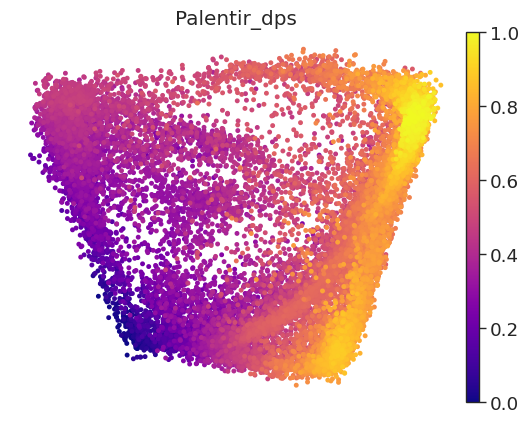

In [278]:
sc.pl.embedding(adata_temp, basis='diffmap_',
               color=['Palentir_dps'], frameon=False, cmap='plasma', size=50)

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


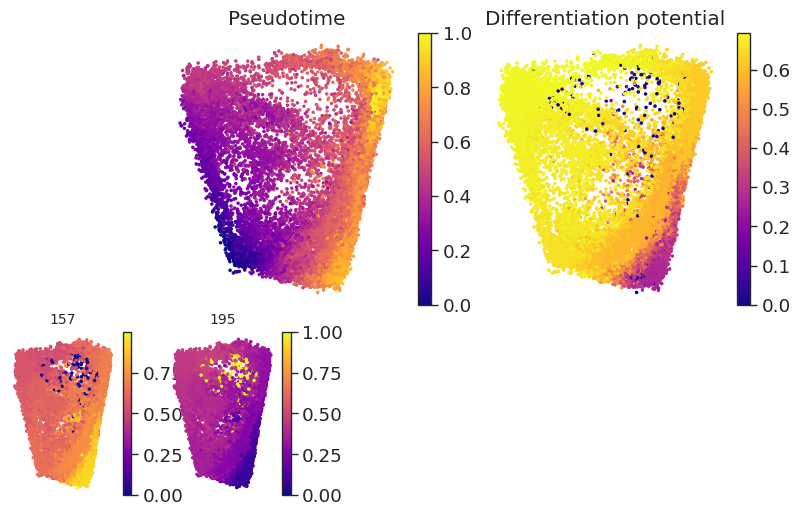

In [277]:
palantir.plot.plot_palantir_results(pr_res, embedding)


In [279]:
pr_res.branch_probs.columns = terminal_states[pr_res.branch_probs.columns]

In [280]:
gene_trends = palantir.presults.compute_gene_trends( pr_res, pd.DataFrame(adata_temp[:, gene_names_].X, columns=gene_names_))

Unable to determine R home: [WinError 2] The system cannot find the file specified


DZ
Time for processing DZ: 0.11870951652526855 minutes
Non GC
Time for processing Non GC: 0.07182549635569255 minutes


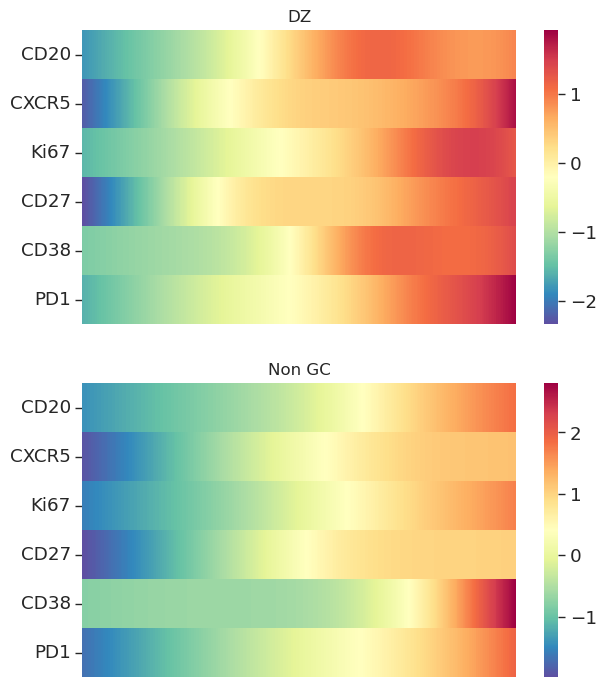

In [281]:
palantir.plot.plot_gene_trend_heatmaps(gene_trends)


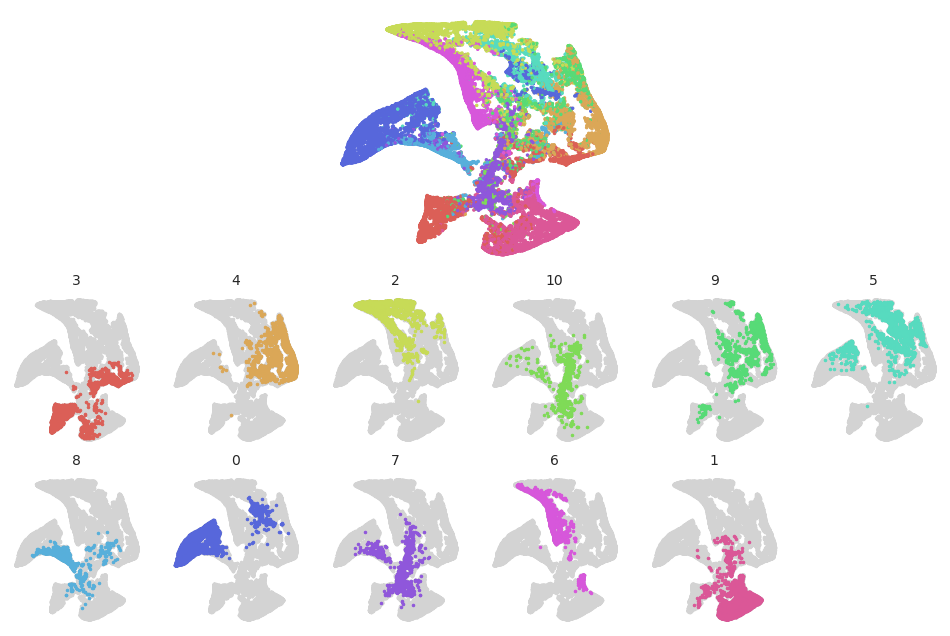

In [282]:
palantir.plot.plot_cell_clusters(tsne, adata_temp.obs.leiden)


# Check metabolites channels with high correlation with pseudo time

## Read metabolites data 

In [91]:
experiment = "tonsil"
cores = ["DonorA", "DonorE"]
datasets = [core + f"_{i}" for core in cores for i in range(1, 7)]

In [92]:
def read_props(dataset, experiment):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{experiment}_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{experiment}_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{experiment}_{dataset}_auto.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [93]:
%%capture 

adatas = []
adatas_raw = []
df_sums = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(dataset, experiment)
        print(f'Sucessfully read dataset {dataset}') 
    except:
        print(f'{dataset} cannot be read') 
        continue
    try:
        df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    except:
        pass
    df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
        df_morph["area"], axis=0
    )
    # data_all = df_intensity_TS.iloc[:, 1:].values
    # data_all_norm = (data_all+0.1)/(np.percentile(data_all,50,axis=1,keepdims=True)+0.1)
    # data_all_norm = MinMaxScaler().fit_transform(data_all)
    # df_intensity_TS.iloc[:, 1:] = data_all_norm
    
    # Merge TS and IMC data
    df = df_intensity_TS
    df.set_index("Id", inplace=True)
    df_sums.append(df.sum(axis=0))
    
    # Put to adata format
    adata = sc.AnnData(df.values)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset
    adata.obs["Core"] = dataset.split("_")[0]
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    
    # FPM normalize
    sc.pp.normalize_total(adata, target_sum=1e5)
    # sc.pp.log1p(adata, base=2)
    adatas_raw.append(adata.copy())
    
    # Standard scale
    sc.pp.scale(adata)
    adatas.append(adata)
    
adata = ad.concat(adatas, join="inner")
adata_raw = ad.concat(adatas_raw, join="inner")

normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished ({time_passed})
normalizing counts per cell
    finished ({time_passed})


In [94]:
df_sum = pd.concat(df_sums, axis=1).mean(axis=1)
mz_qc = df_sum[(df_sum > 20000)].index.tolist()

In [95]:
len(mz_qc)

140

In [96]:
adata = adata[:, mz_qc]

In [97]:
adata

View of AnnData object with n_obs × n_vars = 31156 × 140
    obs: 'Cell', 'Dataset', 'Core'
    obsm: 'spatial'

In [98]:
SIMS_masses = adata.var_names

In [99]:
# Read litterature lut
file_path = data_dir / "metadata" / 'Putative_annotation_09012022.xlsx'
df = pd.read_excel(file_path)
lum = df['m/z'].to_numpy()

# get matched table by looking at difference with error
error = 0.4
matched_dfs = []
for mz in SIMS_masses.astype(float):
    if mz < 1.1:
        continue
    diff = lum-mz
    matched = df[abs(diff)<error]
    if len(matched) > 0:
        matched.loc[:,'SIMS mz'] = mz
        matched_dfs.append(matched)
    else:
        matched = pd.DataFrame([['', '', '', '', mz]], columns=df.columns.tolist() + ['SIMS mz'])
        matched_dfs.append(matched)
matched = pd.concat(matched_dfs)

C:\Users\thu71\AppData\Roaming\Python\Python38\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


In [100]:
# Get all info from litterature excel
SIMS_masses_subset = np.array(matched['SIMS mz'].to_list(), dtype=float).astype(str)
SIMS_masses_subset = pd.Index(SIMS_masses_subset)

SIMS_name_subset = np.array(matched['Molecules'].to_list()).astype(str)
SIMS_name_subset = pd.Index(SIMS_name_subset)

SIMS_nm_subset = SIMS_masses_subset + 'm/z ' + SIMS_name_subset

SIMS_type_subset = np.array(matched['Type'].to_list()).astype(str)
SIMS_type_subset = pd.Index(SIMS_type_subset)

print(f"Number of matched m/z: {len(SIMS_masses_subset)}")

Number of matched m/z: 139


In [101]:
adata_all = adata.copy()
adata = adata[:, SIMS_masses_subset]
adata.var_names = SIMS_nm_subset

## Correlate with pseudo time for B cell trajectory

In [102]:
from sklearn.preprocessing import LabelEncoder
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [116]:
adata.obs = adata.obs.reset_index(drop=True)
adata.obs.index = adata.obs.index.astype(str)

In [121]:
adata_met_subset = adata[adata_b.obs.index]
adata_met_subset = adata_met_subset[adata_.obs['leiden'].isin(paths[0][1])]
adata_met_subset.obs['distance'] = adata_btraj.obs['dpt_pseudotime']

df = pd.DataFrame(adata_met_subset.X, columns=adata_met_subset.var_names.tolist())
df['Pseudotime'] = adata_btraj.obs['dpt_pseudotime'].tolist()
df_corr = df.corr()

C:\Users\thu71\AppData\Local\Temp\ipykernel_30756\1498353568.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_met_subset.obs['distance'] = adata_btraj.obs['dpt_pseudotime']
C:\Users\thu71\Anaconda3\envs\diff\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [122]:
n = 10
marker = 'Pseudotime'

n_cut = 50

# Get positive and negative correlation
corr_pos = df_corr.loc[marker].nlargest(25).index.tolist()
corr_neg = df_corr.loc[marker].nsmallest(25).index.tolist()

# Get only SIMS masses
corr_pos = [corr for corr in corr_pos if corr in SIMS_nm_subset][:n]
corr_neg = [corr for corr in corr_neg if corr in SIMS_nm_subset][:n]
corr_list = [marker] + corr_pos + corr_neg

# Get range 
df_intensity = df[corr_list]
df_intensity.sort_values(by=[marker], inplace=True)
df_intensity[f'{marker} cut'] = pd.qcut(df_intensity[marker], n_cut, duplicates='drop') 

LE = LabelEncoder()
df_intensity[f'{marker} cut'] = LE.fit_transform(df_intensity[f'{marker} cut'])

C:\Users\thu71\AppData\Roaming\Python\Python38\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)
C:\Users\thu71\AppData\Local\Temp\ipykernel_30756\3796898406.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_intensity[f'{marker} cut'] = pd.qcut(df_intensity[marker], n_cut, duplicates='drop')
C:\Users\thu71\AppData\Local\Temp\ipykernel_30756\3796898406.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

In [123]:
df_sort = df_intensity.groupby('Pseudotime cut').mean()

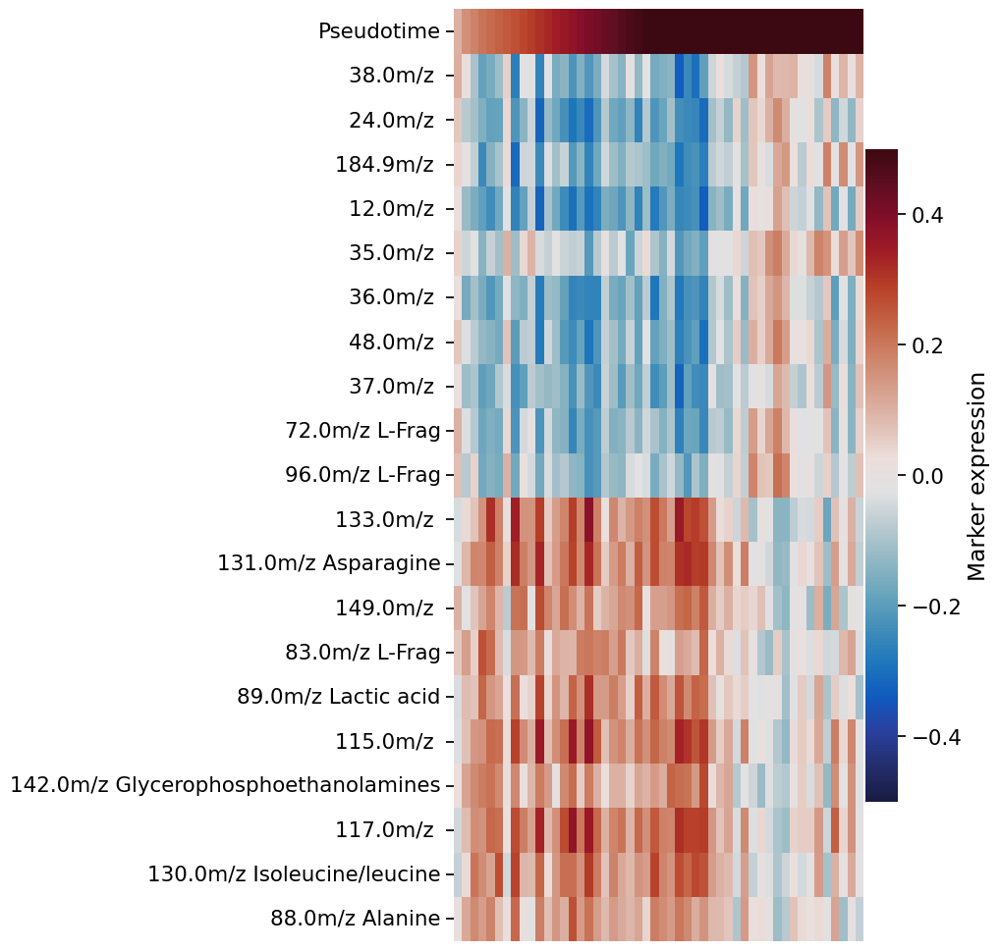

In [126]:
with sns.plotting_context('notebook', font_scale=1.4):
    fig, ax = plt.subplots(figsize=(10,10))
    ax = sns.heatmap(df_sort.T, ax=ax, cmap=heatmap_cmp,
                     xticklabels=False, yticklabels=True, 
                     cbar_kws={"label": "Marker expression", "pad": 0.004, "shrink": 0.7}, vmin=-0.5, vmax=0.5)
    ax.set(xlabel='')
    plt.tight_layout()
    plt.show()